In [1]:
# Imports
import pandas as pd
import yfinance as yf
import hvplot.pandas
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import glob
import cufflinks as cf
import scipy.stats as stats
import scipy.optimize as sp_optimize

In [2]:
# Imports
plt.style.use("seaborn")
cf.set_config_file(offline = True)
%matplotlib inline

# Cleaning Data, visualization and heatmap

In [3]:
# reading csv and display data 
Gex_dix_sp500 = pd.read_csv("DIX.csv",parse_dates=True, infer_datetime_format=True, index_col="date")


#display data
display(Gex_dix_sp500.head(2))
display(Gex_dix_sp500.tail(2))

,price,dix,gex
date,,,
2011-05-02,1361.219971,0.378842,1.897313e+09
2011-05-03,1356.619995,0.383411,1.859731e+09


,price,dix,gex
date,,,
2022-11-10,3956.370117,0.420308,3.748514e+09
2022-11-11,3992.929932,0.453651,3.230478e+09


In [4]:
# apply info and describe functions so we can see the entries and columns types
display(Gex_dix_sp500.info())
display(Gex_dix_sp500.describe())

#check na's
Gex_dix_sp500.isna().sum()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2905 entries, 2011-05-02 to 2022-11-11
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   price   2905 non-null   float64
 1   dix     2905 non-null   float64
 2   gex     2905 non-null   float64
dtypes: float64(3)
memory usage: 90.8 KB


None

,price,dix,gex
count,2905.000000,2905.000000,2.905000e+03
mean,2524.276203,0.425404,2.638327e+09
std,942.089872,0.031516,2.842871e+09
min,1099.229980,0.330555,-7.496823e+09
25%,1857.439941,0.403986,1.128801e+09
50%,2296.680000,0.423250,2.205509e+09
75%,3003.370000,0.443416,3.426865e+09
max,4796.560059,0.551115,2.421867e+10


price    0
dix      0
gex      0
dtype: int64

In [5]:
# # get date from yfinance 
stocks = ["^VIX","SPY","QQQ"]
vix_df = pd.DataFrame()
for ticker in stocks:
    vix_df[ticker] = yf.download(ticker, start="2011-05-02", end= "2022-11-11")['Close']


# check is na's
vix_df.isna().sum()

# display data 
display(vix_df.head(2))
display(vix_df.tail(2))

# check is na's
vix_df.isna().sum()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,^VIX,SPY,QQQ
Date,,,
2011-05-02,15.990000,136.220001,58.970001
2011-05-03,16.700001,135.729996,58.689999


,^VIX,SPY,QQQ
Date,,,
2022-11-09,26.090000,374.130005,263.320007
2022-11-10,23.530001,394.690002,282.750000


^VIX    0
SPY     0
QQQ     0
dtype: int64

In [6]:
# data transformation and add more features 
vix_df["Implied Volatility"] = vix_df["^VIX"] / 16
# apply pct_change
Gex_dix_sp500["absolute move sp500"] =(Gex_dix_sp500["price"].pct_change()*100).abs()
# sp500 - IV
#Gex_dix_sp500["sp500 IV"] = Gex_dix_sp500["absolute move sp500"] - Gex_dix_sp500["Implied Volatility"]

# calculate 5 days rolling mean on volatility index 
vix_df["vix 5 days"] = vix_df["^VIX"].rolling(5).mean().dropna()
# calculate 21 days rolling mean on volatility index 
vix_df["vix 21 days"] = vix_df["^VIX"].rolling(21).mean().dropna()
# check is na's
vix_df.isna().sum()

^VIX                   0
SPY                    0
QQQ                    0
Implied Volatility     0
vix 5 days             4
vix 21 days           20
dtype: int64

In [7]:

# Concat dataframe 
df_gex = pd.concat([Gex_dix_sp500, vix_df], axis=1).rename(columns={"^VIX":"VIX","Implied Volatility":"IV"})

# divide gex / 1e9
#df_gex =df_gex['gex'] / 1e9

# drop na
df_gex.dropna(inplace=True)

# display data 
display(df_gex.head(2))
display(df_gex.tail(2))
        
# check if still nan's
df_gex.isna().sum()

# plot dataframe

df_gex.iplot(fill=True, colorscale="polar", theme="solar",
                    title = "Gemma exposure on sp500 index", xTitle="Time", yTitle="stocks Price")


,price,dix,gex,absolute move sp500,VIX,SPY,QQQ,IV,vix 5 days,vix 21 days
2011-05-31,1345.199951,0.402477,1.501019e+09,1.059272,15.450000,134.899994,58.360001,0.965625,16.482,16.911429
2011-06-01,1314.550049,0.441582,7.654729e+08,2.278464,18.299999,131.869995,57.090000,1.143750,16.578,17.021429


,price,dix,gex,absolute move sp500,VIX,SPY,QQQ,IV,vix 5 days,vix 21 days
2022-11-09,3748.570068,0.457835,4.817286e+07,2.077789,26.090000,374.130005,263.320007,1.630625,25.166,28.187619
2022-11-10,3956.370117,0.420308,3.748514e+09,5.543448,23.530001,394.690002,282.750000,1.470625,24.812,27.709524


In [8]:
df_gex.to_csv("df_gex_update.csv")

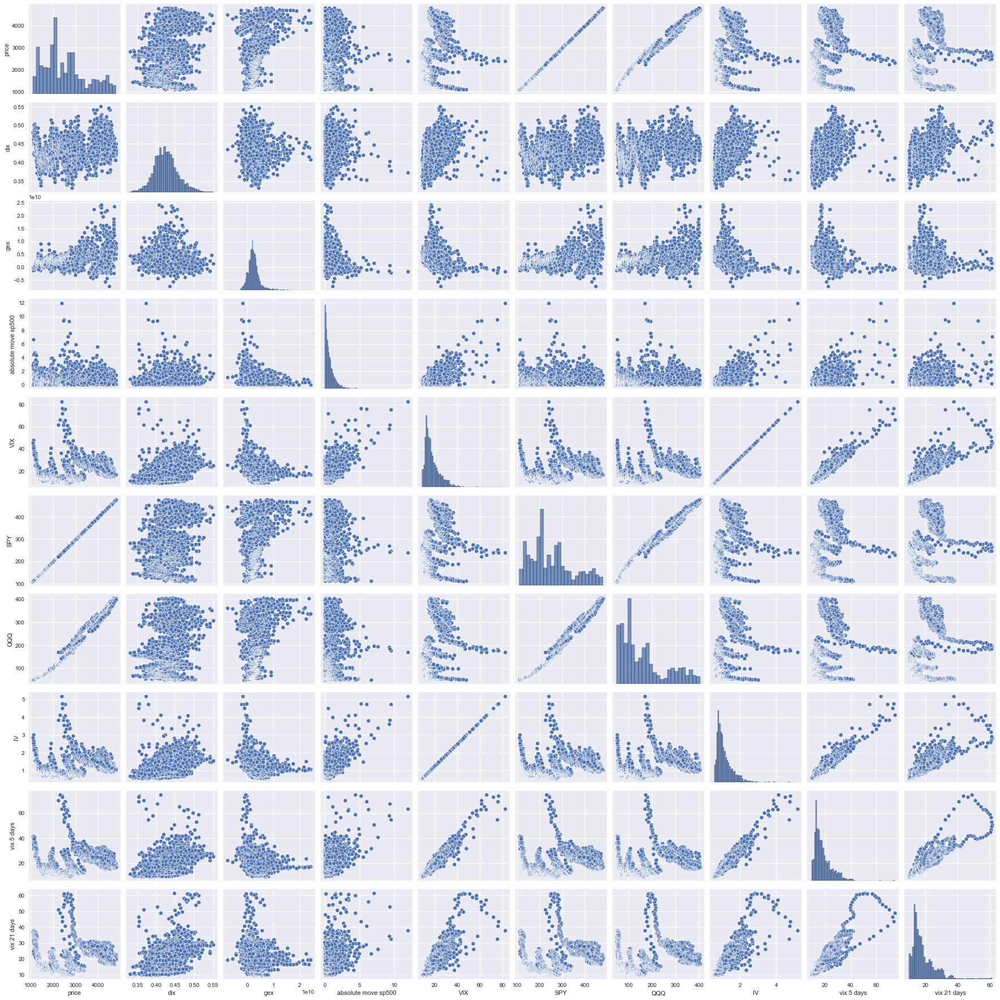

In [9]:
# display and visualize how data distributed  
sns.pairplot(df_gex, kind='scatter',palette='coolwarm')
plt.show()

# Machine Learning

In [69]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import statsmodels.formula.api as smf
#from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_errore
from sklearn import metrics
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor

In [11]:
# read csv
gex_df = pd.read_csv("df_gex_update.csv")

In [12]:
# drop surplus data 
df_gex =gex_df.drop(columns=["Unnamed: 0","price"])
# del df_gex["price"]
# del df_gex["Unnamed: 0"]

In [13]:
# apply info and describe functions so we can see the entries and columns types
display(df_gex.info())
display(df_gex.describe())

#check na's
df_gex.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2884 entries, 0 to 2883
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   dix                  2884 non-null   float64
 1   gex                  2884 non-null   float64
 2   absolute move sp500  2884 non-null   float64
 3   VIX                  2884 non-null   float64
 4   SPY                  2884 non-null   float64
 5   QQQ                  2884 non-null   float64
 6   IV                   2884 non-null   float64
 7   vix 5 days           2884 non-null   float64
 8   vix 21 days          2884 non-null   float64
dtypes: float64(9)
memory usage: 202.9 KB


None

,dix,gex,absolute move sp500,VIX,SPY,QQQ,IV,vix 5 days,vix 21 days
count,2884.000000,2.884000e+03,2884.000000,2884.000000,2884.000000,2884.000000,2884.000000,2884.000000,2884.000000
mean,0.425583,2.647475e+09,0.735261,18.360922,252.961099,162.323100,1.147558,18.355120,18.328924
std,0.031533,2.850701e+09,0.861140,7.510815,93.592633,94.926138,0.469426,7.345474,6.922871
min,0.330555,-7.496823e+09,0.000000,9.140000,109.930000,50.029999,0.571250,9.376000,9.800000
25%,0.404181,1.136918e+09,0.191031,13.317500,186.682503,88.937500,0.832344,13.353500,13.729643
50%,0.423410,2.214311e+09,0.476793,16.155000,233.659996,129.909996,1.009687,16.197000,16.307857
75%,0.443469,3.445059e+09,0.980586,21.282501,300.242493,203.040001,1.330156,21.095000,21.196786
max,0.551115,2.421867e+10,11.981453,82.690002,477.709991,403.989990,5.168125,74.618001,61.258572


dix                    0
gex                    0
absolute move sp500    0
VIX                    0
SPY                    0
QQQ                    0
IV                     0
vix 5 days             0
vix 21 days            0
dtype: int64

In [29]:
# x features and y target
y = df_gex['absolute move sp500']#.reshape(-1, 1)
X = df_gex.drop(columns=["absolute move sp500"])#.values#,"date"],axis=1)

In [30]:
# check values
X = X.values
y = y.values

In [31]:

# Split train and Test Data

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=1)

# SVR

In [45]:
# # Scaling out dataframe 
scaler = StandardScaler()

In [46]:
# Scale Data

X_scaler = scaler.fit(X_train)
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [47]:
# Set Model

model = SVR(kernel="rbf")

In [48]:
# Fit Model

model.fit(X_train_scaled,y_train)

SVR()

In [56]:
# make prediction
y_pred = model.predict(X_test_scaled)

In [57]:
#model.score(X,y)

In [58]:
y_pred

array([0.35358678, 0.36464139, 0.26883993, 0.47654735, 0.44042989,
       0.37915641, 3.19075968, 0.33597717, 0.78769132, 0.87569974,
       0.34223481, 0.38328604, 1.261968  , 0.20934381, 0.30351347,
       0.64243275, 0.16212016, 0.37242929, 0.37765621, 0.68366025,
       0.29672241, 0.27452955, 0.44655481, 0.58618108, 0.44175786,
       0.19724449, 1.27230372, 0.42721091, 0.34291979, 0.39371786,
       0.46414237, 0.33203689, 0.87525955, 0.4417925 , 0.94692398,
       0.19185582, 0.20059768, 0.69096535, 0.69825988, 0.25326179,
       0.77985187, 0.6409968 , 0.90397955, 0.7182121 , 0.20962394,
       0.87825575, 0.85375257, 1.04322185, 0.18846542, 0.21209366,
       0.30338129, 0.48825912, 0.19142932, 0.3075906 , 0.3308968 ,
       0.3452167 , 0.33588724, 0.79943102, 0.35708302, 0.25677879,
       0.25595794, 1.06547881, 1.9302381 , 1.07753029, 0.47053448,
       0.6610666 , 0.23832263, 1.25842965, 0.48096596, 0.41608177,
       0.38025755, 0.76420848, 0.46021161, 0.476515  , 0.34965

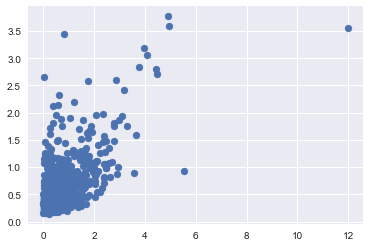

In [60]:
#plt.scatter(X,y)
plt.scatter(y_test, y_pred)


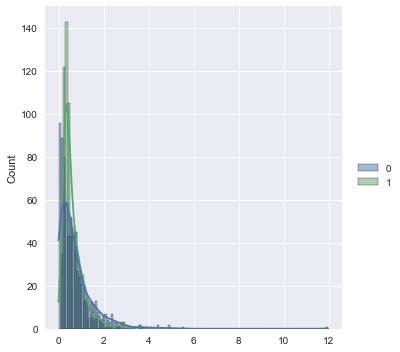

In [62]:
sns.displot((y_test,y_pred ),kde=True, kind="hist")

In [64]:
print('MEA',metrics.mean_absolute_error(y_test,y_pred))
print('MSE',metrics.mean_squared_error(y_test,y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
print('MGD', mean_gamma_deviance(y_test,y_pred))
print('R2S',r2_score(y_test, y_pred))
    

MEA 0.4342323519775916
MSE 0.471004418790411
RMSE 0.6862976167745383
MGD 0.9558972832586118
R2S 0.38563841433126933


# GradientBoostingRegressor

In [71]:
# Import model
reg = GradientBoostingRegressor(random_state=0,
                                criterion='mse',
                                n_estimators=200,
                                verbose=1,
                                
                                
                                
                               )

In [75]:
# fit 
fit =reg.fit(X_train_scaled,y_train)

      Iter       Train Loss   Remaining Time 
         1           0.6695            0.99s
         2           0.6178            0.89s
         3           0.5725            0.92s
         4           0.5360            1.03s
         5           0.5063            0.98s
         6           0.4800            0.94s
         7           0.4585            0.94s
         8           0.4389            0.91s
         9           0.4231            0.87s
        10           0.4087            0.86s
        20           0.3386            0.75s
        30           0.3106            0.69s
        40           0.2956            0.64s
        50           0.2803            0.60s
        60           0.2724            0.56s
        70           0.2618            0.52s
        80           0.2524            0.47s
        90           0.2448            0.43s
       100           0.2376            0.39s
       200           0.1752            0.00s


In [85]:
pred = reg.predict(X_test_scaled)

In [89]:
#Accuracy check
r2s = r2_score(y_test, pred)
print("R2S : % f" %(r2s))
print("MSE:", mean_squared_error(y_test,pred))

R2S :  0.439286
MSE: 0.42987535029641394
